In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.notebook import tqdm
import warnings
warnings.filterwarnings('ignore')
from sklearn import metrics
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.cluster import KMeans, AffinityPropagation, MeanShift, AgglomerativeClustering, DBSCAN, Birch
from sklearn.mixture import GaussianMixture

In [33]:
data=pd.read_csv('Customer_Data.csv')

In [34]:
df=pd.DataFrame(data)
df.isna().sum()

CUST_ID                               0
BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [35]:
df=df.dropna()
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000
mean,1601.224893,0.895035,1025.433874,604.901438,420.843533,994.175523,0.496000,0.205909,0.368820,0.137604,3.313918,15.033233,4522.091030,1784.478099,864.304943,0.159304,11.534391
std,2095.571300,0.207697,2167.107984,1684.307803,917.245182,2121.458303,0.401273,0.300054,0.398093,0.201791,6.912506,25.180468,3659.240379,2909.810090,2372.566350,0.296271,1.310984
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.049513,0.019163,0.000000,6.000000
25%,148.095189,0.909091,43.367500,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,418.559237,169.163545,0.000000,12.000000
50%,916.855459,1.000000,375.405000,44.995000,94.785000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,896.675701,312.452292,0.000000,12.000000
75%,2105.195853,1.000000,1145.980000,599.100000,484.147500,1132.385490,0.916667,0.333333,0.750000,0.250000,4.000000,18.000000,6500.000000,1951.142090,825.496463,0.166667,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


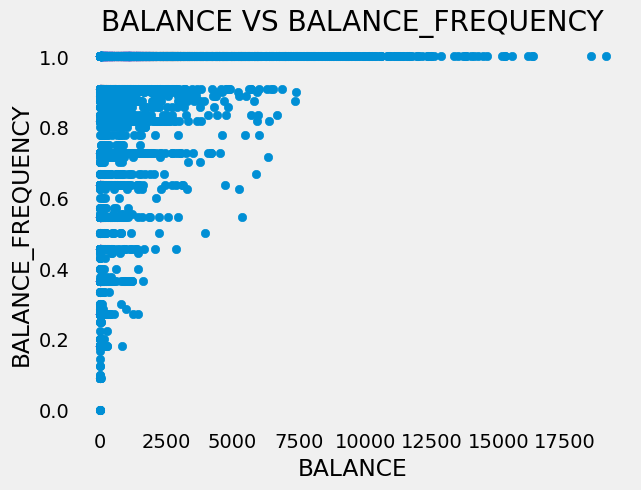

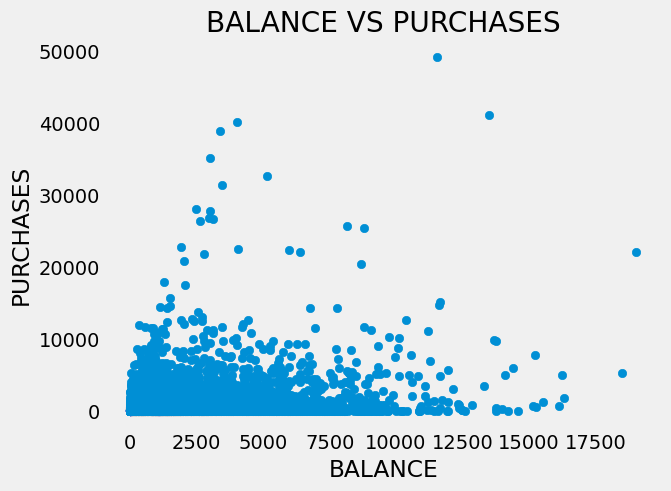

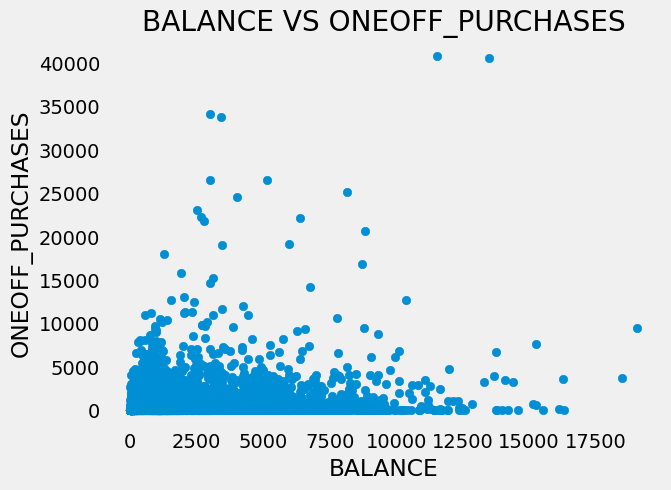

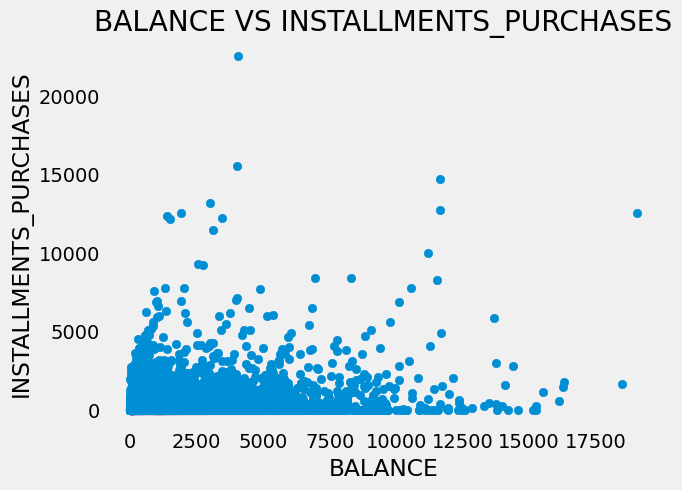

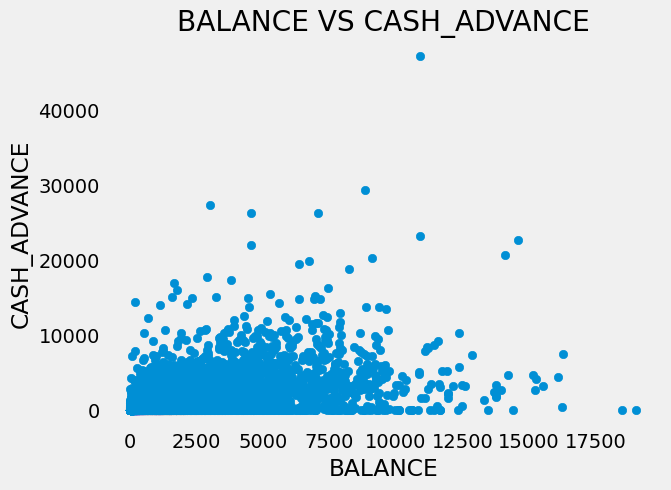

...

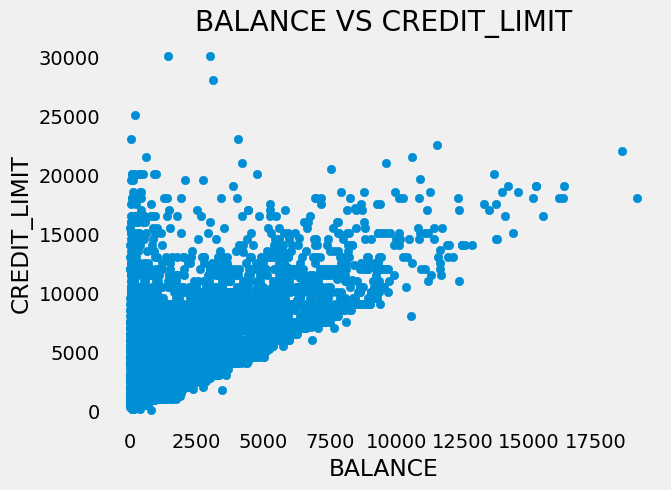

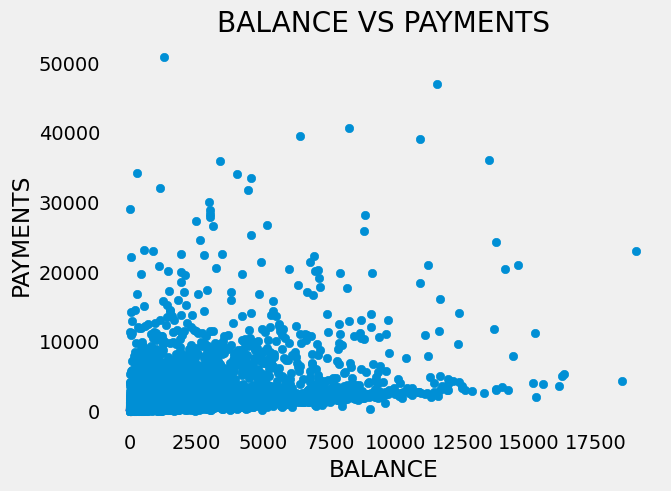

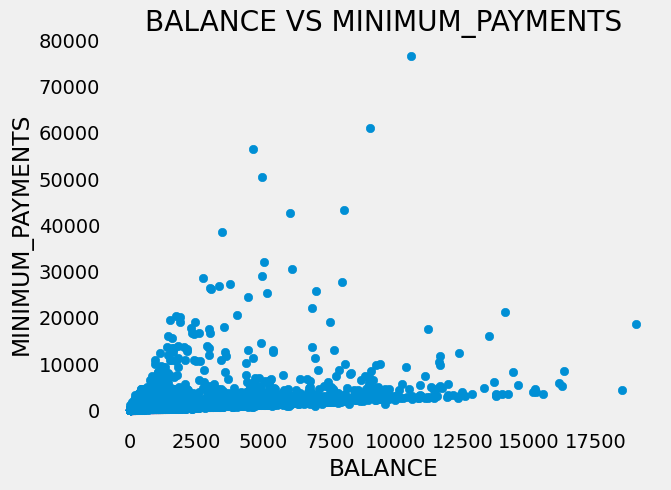

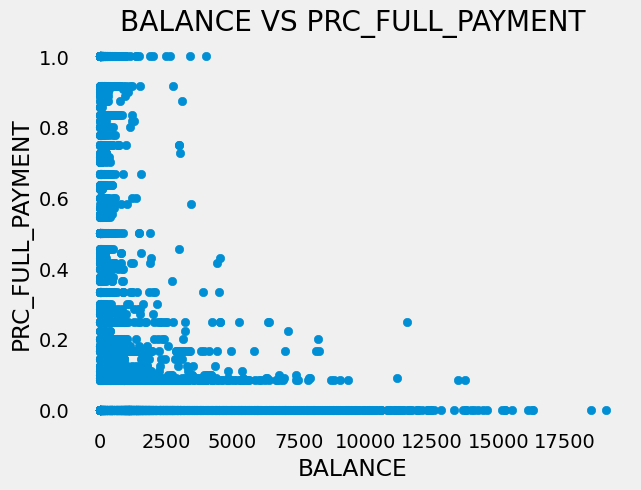

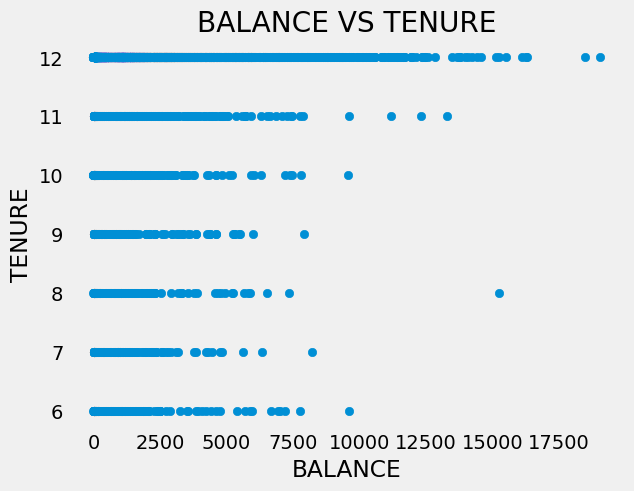

In [36]:
values=['BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',	'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY','CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',	'TENURE']
for val in values:
    plt.title("BALANCE VS " + val)
    plt.scatter(df['BALANCE'], df[val])
    plt.xlabel('BALANCE')
    plt.ylabel(val)
    plt.grid()
    plt.show()

In [37]:
new_df=df.drop('CUST_ID', axis=1)

In [38]:
scaler = preprocessing.StandardScaler()
scaled = scaler.fit_transform(new_df)
X=pd.DataFrame(new_df, columns=['BALANCE', 'BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY', 'CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT', 'TENURE'])
X_train, X_test = train_test_split(X, random_state=0, test_size=.3)

In [39]:
new_df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000,8636.000000
mean,1601.224893,0.895035,1025.433874,604.901438,420.843533,994.175523,0.496000,0.205909,0.368820,0.137604,3.313918,15.033233,4522.091030,1784.478099,864.304943,0.159304,11.534391
std,2095.571300,0.207697,2167.107984,1684.307803,917.245182,2121.458303,0.401273,0.300054,0.398093,0.201791,6.912506,25.180468,3659.240379,2909.810090,2372.566350,0.296271,1.310984
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.049513,0.019163,0.000000,6.000000
25%,148.095189,0.909091,43.367500,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,418.559237,169.163545,0.000000,12.000000
50%,916.855459,1.000000,375.405000,44.995000,94.785000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,896.675701,312.452292,0.000000,12.000000
75%,2105.195853,1.000000,1145.980000,599.100000,484.147500,1132.385490,0.916667,0.333333,0.750000,0.250000,4.000000,18.000000,6500.000000,1951.142090,825.496463,0.166667,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


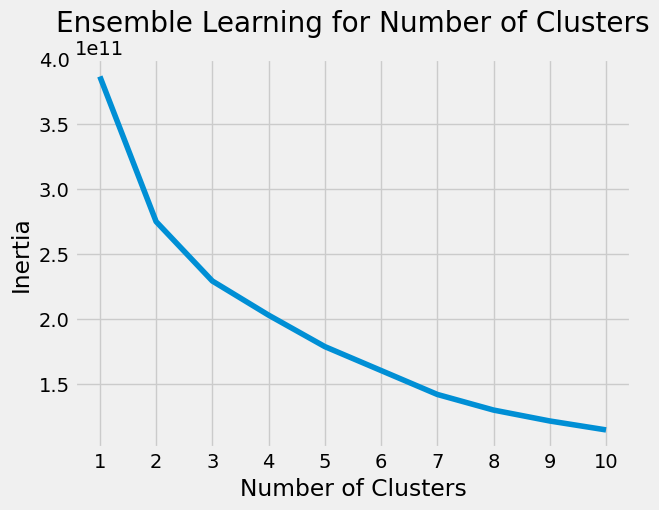

In [40]:
kmeans_setting = {'init':'random', 'n_init':10, 'max_iter':300, 'random_state':42}
kmeans_list = []
for k in range(1,11):
    model_kmean = KMeans(n_clusters=k, **kmeans_setting)
    model_kmean.fit(new_df)
    kmeans_list.append(model_kmean.inertia_)

plt.style.use("fivethirtyeight")
plt.title('Ensemble Learning for Number of Clusters')
plt.plot(range(1, 11), kmeans_list)
plt.xticks(range(1,11))
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()

In [41]:
model_kmeans_1 = KMeans(n_clusters=3)
model_kmeans_1.fit(X_train)
pred_kmeans =  model_kmeans_1.predict(X_test)
model_kmeans_2 = KMeans(n_clusters=3).fit(new_df)
centroids = model_kmeans_2.cluster_centers_
print(centroids)

[[8.81447559e+02 8.76464108e-01 6.24425539e+02 3.23832407e+02
  3.00901956e+02 5.00910489e+02 4.74914145e-01 1.58727403e-01
  3.57492397e-01 1.08473896e-01 2.29477021e+00 1.10393027e+01
  2.77887062e+03 1.03871921e+03 5.72642601e+02 1.64822958e-01
  1.14581616e+01]
 [4.83073379e+03 9.16967664e-01 1.09117699e+04 7.69262336e+03
  3.21931844e+03 5.17149377e+03 7.59576219e-01 6.04345945e-01
  6.13561977e-01 2.25522508e-01 9.25000000e+00 8.74765625e+01
  1.24886719e+04 1.80863983e+04 2.49055499e+03 3.39700266e-01
  1.18359375e+01]
 [3.47948597e+03 9.47071356e-01 1.60091685e+03 9.99040282e+02
  6.02202298e+02 2.16697153e+03 5.41183799e-01 3.18153637e-01
  3.87088056e-01 2.16111348e-01 5.89399454e+00 2.22802548e+01
  9.06258169e+03 2.97605810e+03 1.60690247e+03 1.32953414e-01
  1.17356688e+01]]


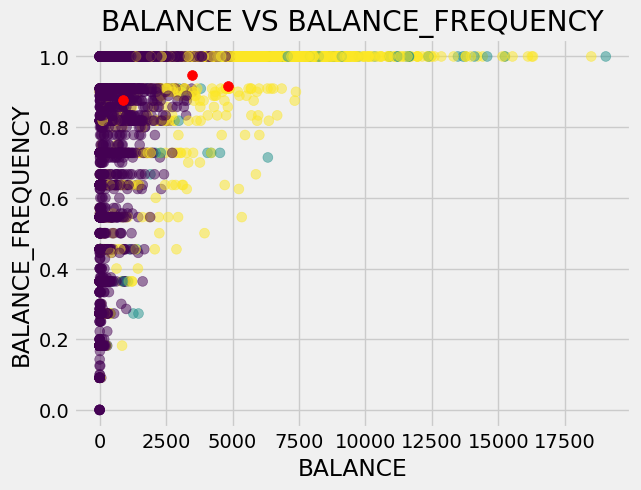

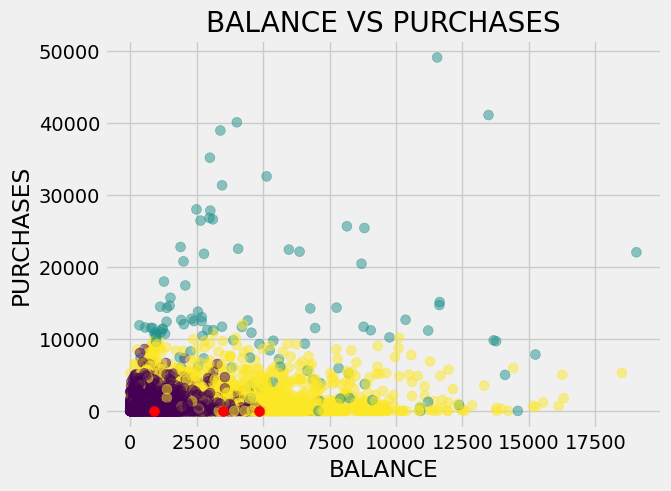

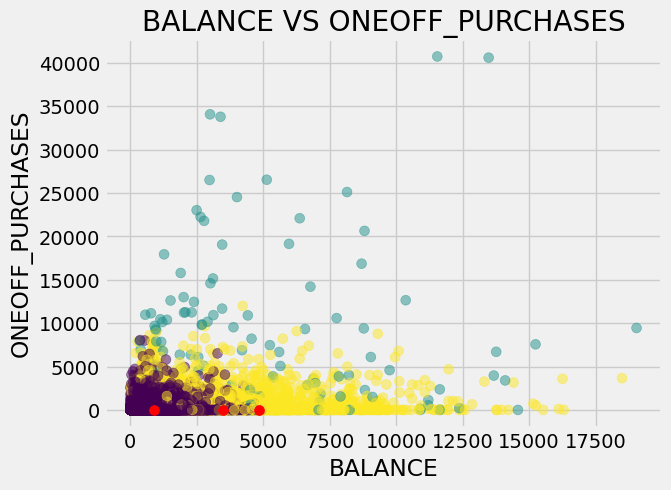

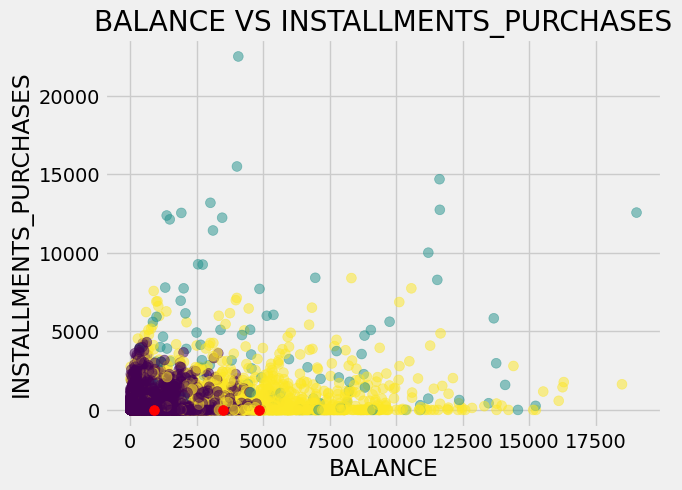

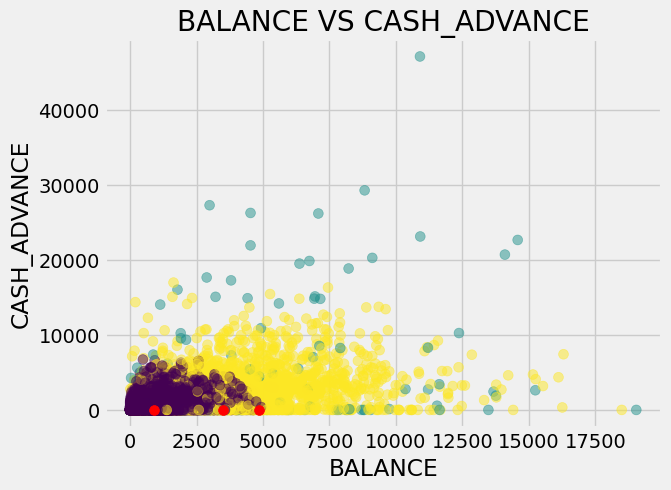

...

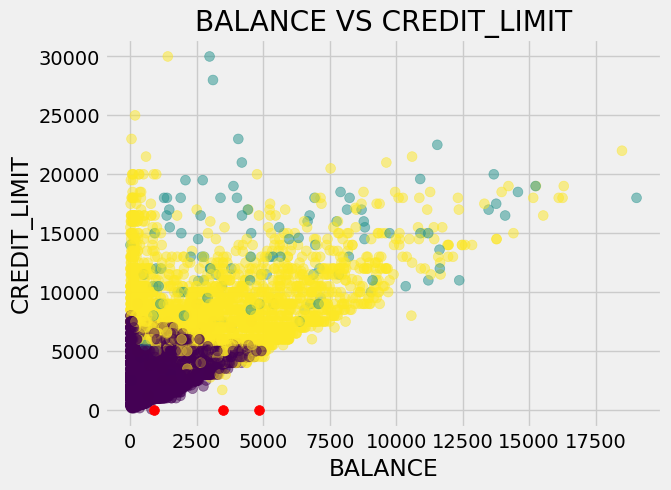

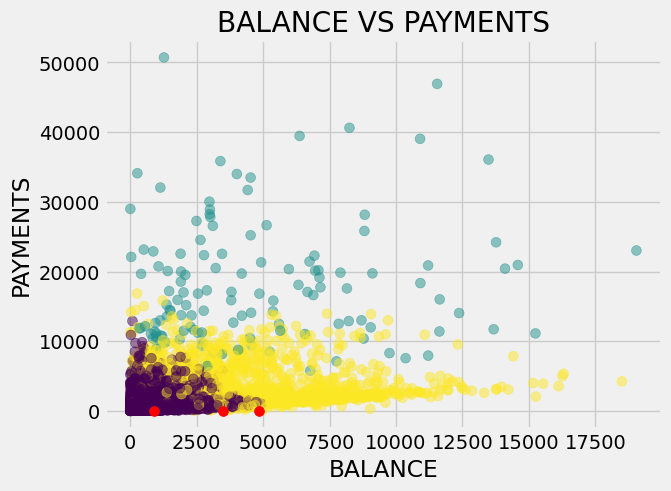

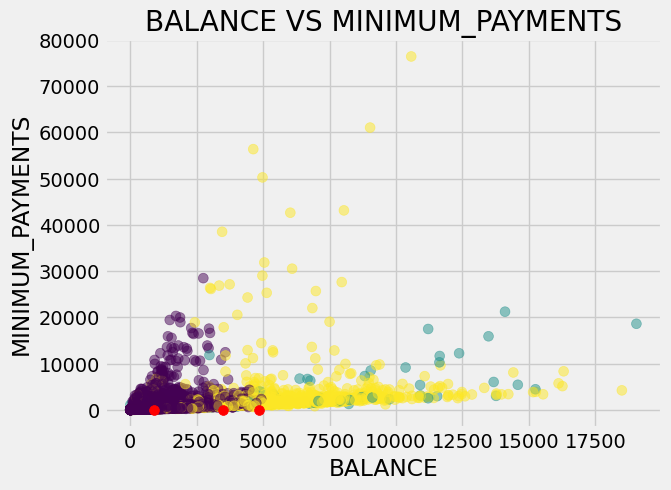

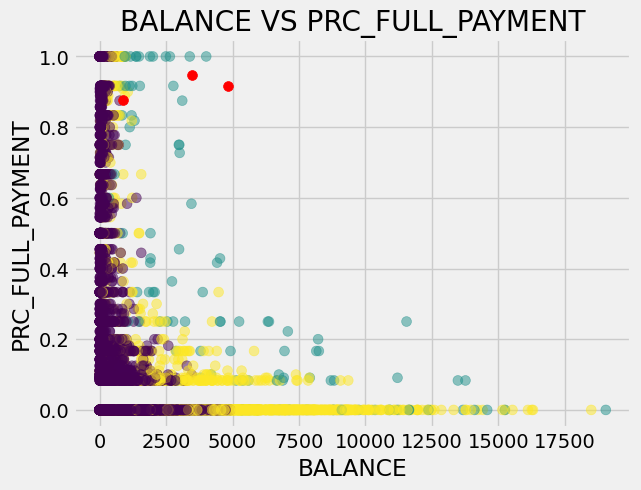

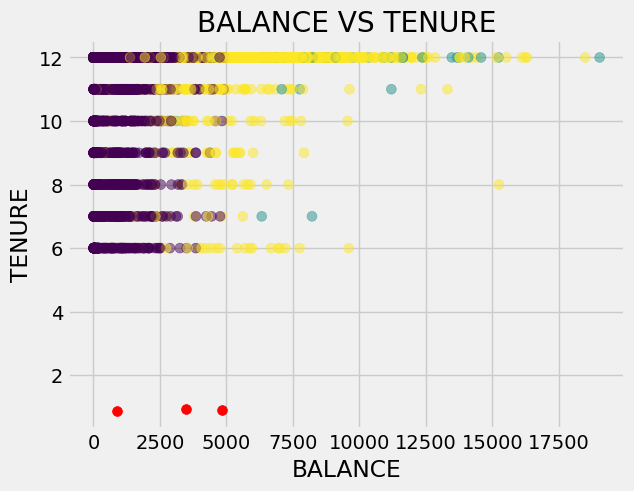

In [42]:
values=['BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',	'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY','CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',	'TENURE']
for val in values:
    plt.title("BALANCE VS " + val)
    plt.scatter(new_df['BALANCE'], new_df[val], c= model_kmeans_2.labels_.astype(float), s=50, alpha=0.5)
    plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
    plt.xlabel('BALANCE')
    plt.ylabel(val)
    plt.show()

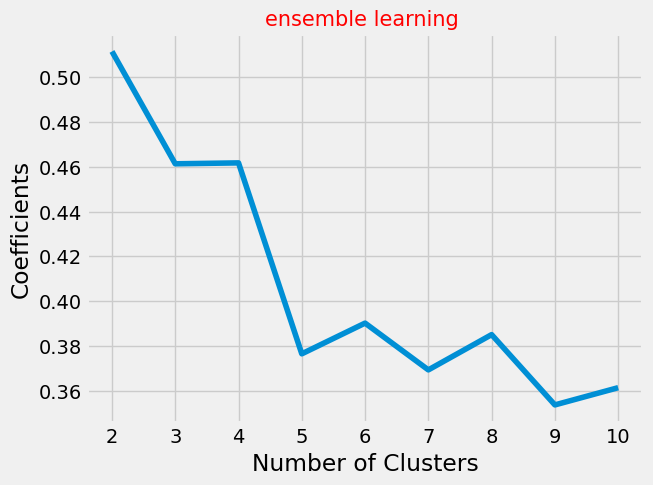

In [43]:
coefficients = []
for k in range(2,11):
    model_kmean_3 = KMeans(n_clusters=k, **kmeans_setting)
    model_kmean_3.fit(new_df)
    score = metrics.silhouette_score(new_df, model_kmean_3.labels_)
    coefficients.append(score)


plt.style.use("fivethirtyeight")
plt.title('ensemble learning ', fontsize=15, color='r')
plt.plot(range(2, 11), coefficients)
plt.xticks(range(2,11))
plt.xlabel('Number of Clusters')
plt.ylabel('Coefficients')
plt.show()

In [44]:
model_AffinityPropagation_1 = AffinityPropagation()
model_AffinityPropagation_1.fit(X_train)
pred_AffinityPropagation =  model_AffinityPropagation_1.predict(X_test)
model_AffinityPropagation = AffinityPropagation()
model_AffinityPropagation.fit(new_df)
centroids = model_AffinityPropagation.cluster_centers_
print(centroids)

[[6.88621323e+03 1.00000000e+00 1.61170000e+03 ... 2.10990649e+03
  0.00000000e+00 1.20000000e+01]
 [2.01668469e+03 1.00000000e+00 1.76680000e+02 ... 1.35572973e+04
  0.00000000e+00 1.20000000e+01]
 [3.80015138e+03 8.18182000e-01 4.24835000e+03 ... 1.42542653e+03
  0.00000000e+00 1.20000000e+01]
 ...
 [1.61442459e+02 1.00000000e+00 1.76761000e+03 ... 1.76279370e+02
  5.83333000e-01 1.20000000e+01]
 [1.81230897e+03 1.00000000e+00 2.19800000e+02 ... 3.74701550e+02
  0.00000000e+00 1.20000000e+01]
 [1.52062376e+03 8.18182000e-01 0.00000000e+00 ... 3.72930377e+02
  0.00000000e+00 1.10000000e+01]]


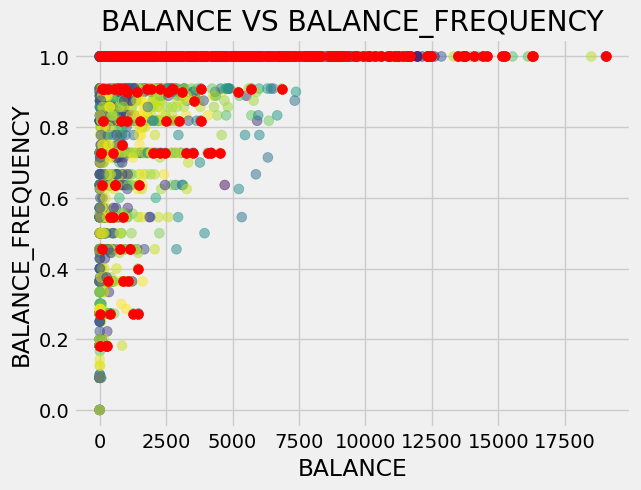

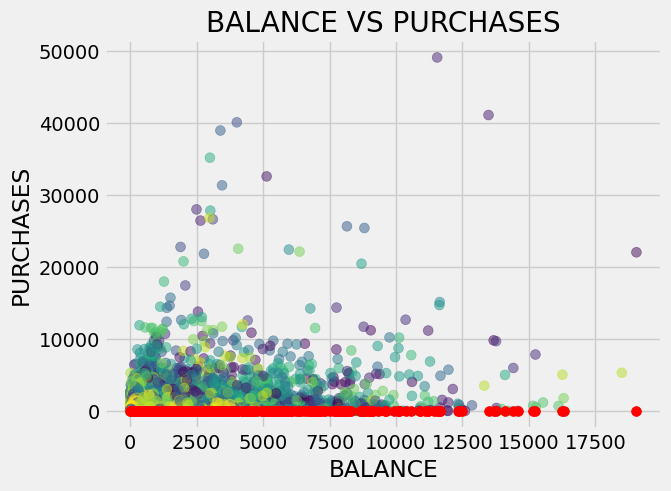

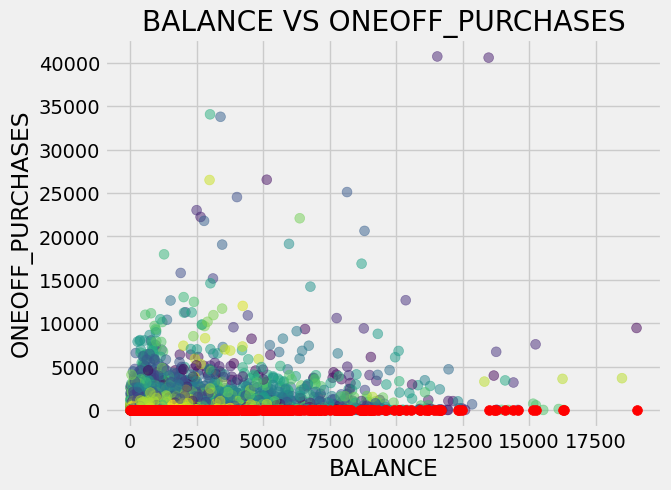

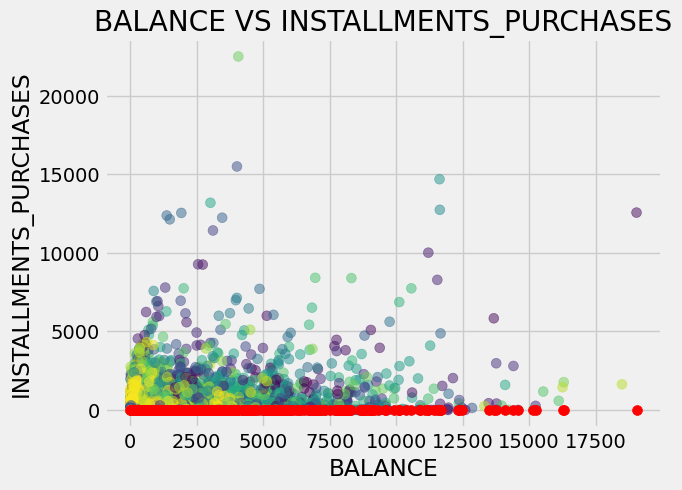

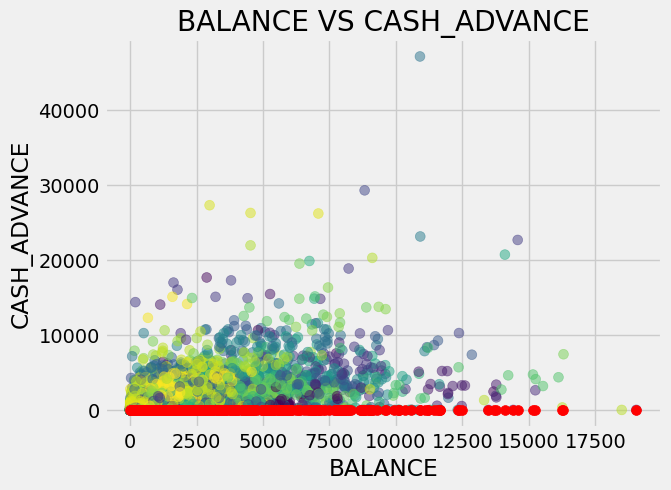

...

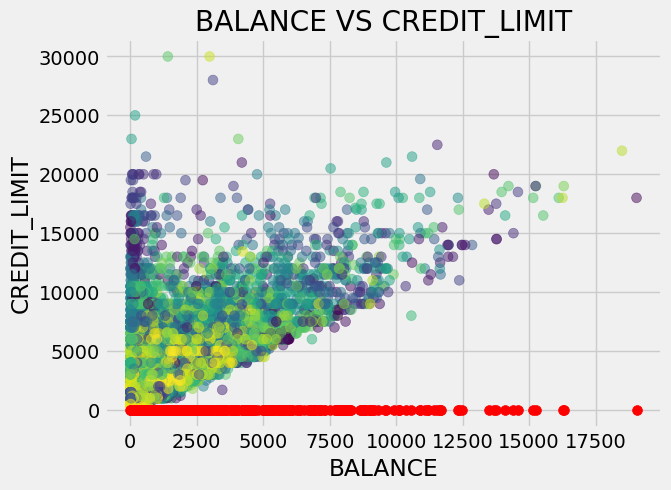

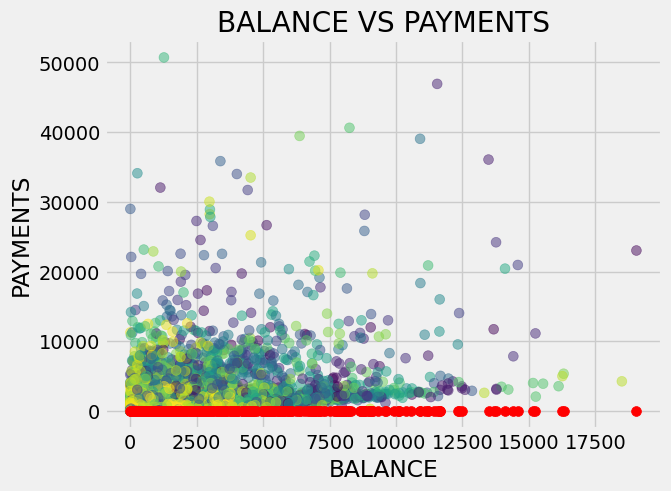

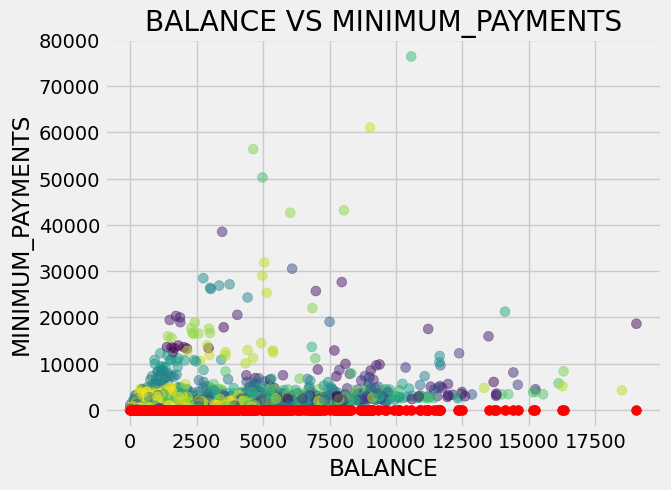

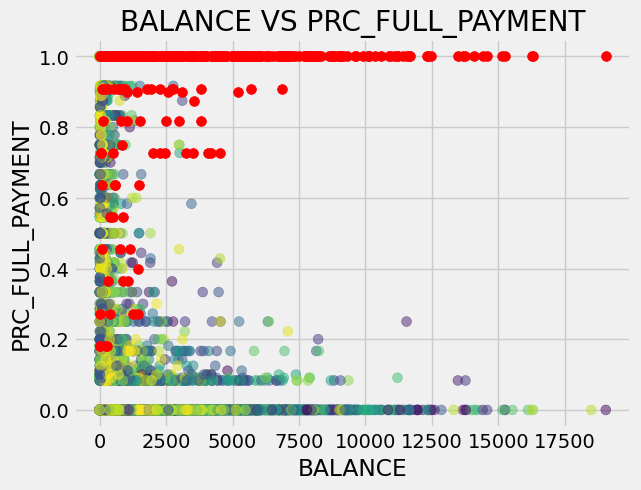

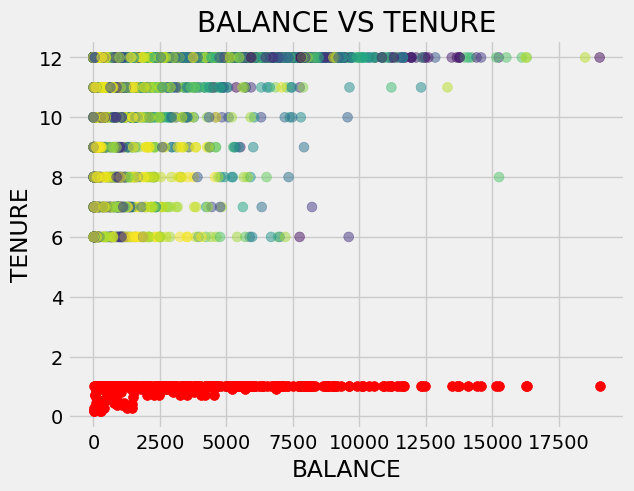

In [45]:
values=['BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',	'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY','CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',	'TENURE']
for val in values:
    plt.title("BALANCE VS " + val)
    plt.scatter(new_df['BALANCE'], new_df[val], c=model_AffinityPropagation.labels_.astype(float), s=50, alpha=0.5)
    plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
    plt.xlabel('BALANCE')
    plt.ylabel(val)
    plt.show()

In [46]:
model_MeanShift_1 = MeanShift()
model_MeanShift_1.fit(X_train)
pred_MeanShift =  model_MeanShift_1.predict(X_test)
model_MeanShift = MeanShift()
model_MeanShift.fit(new_df)

MeanShift()

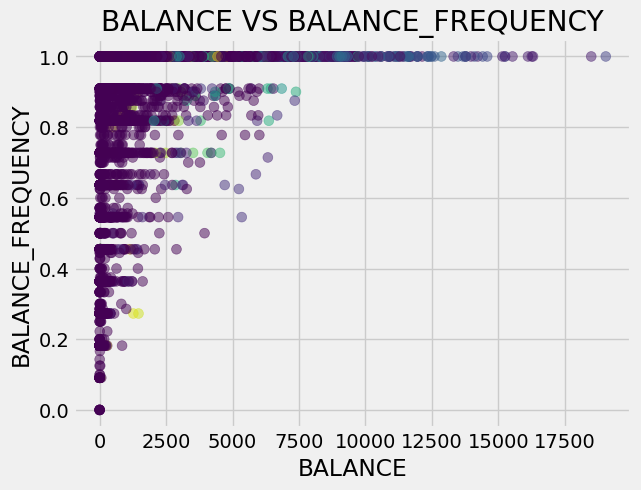

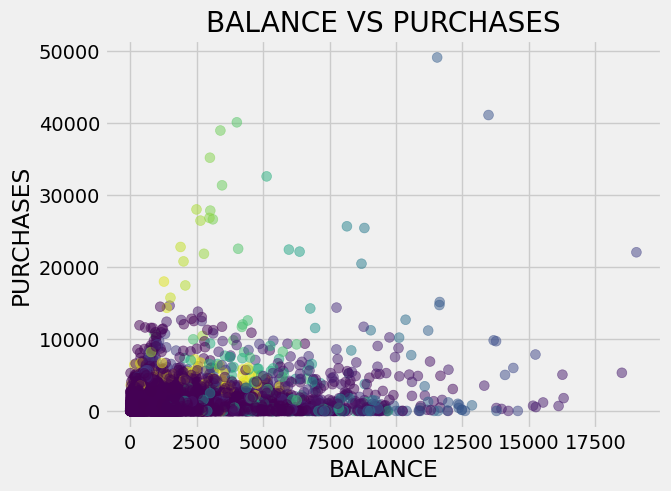

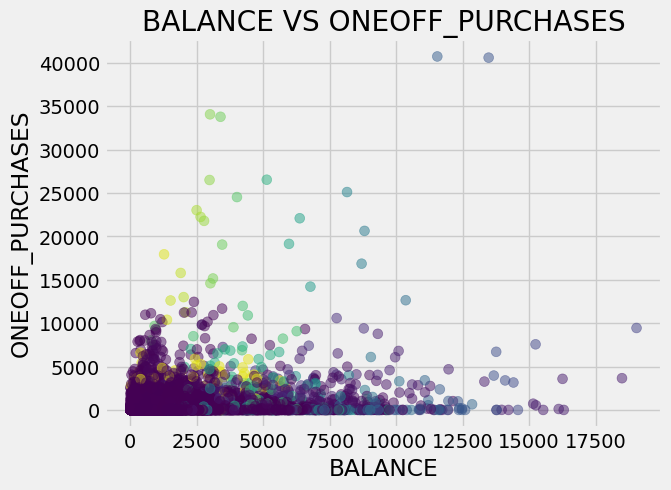

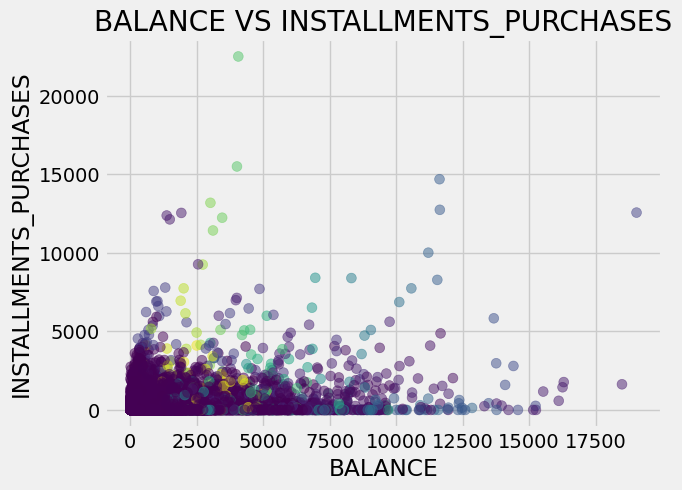

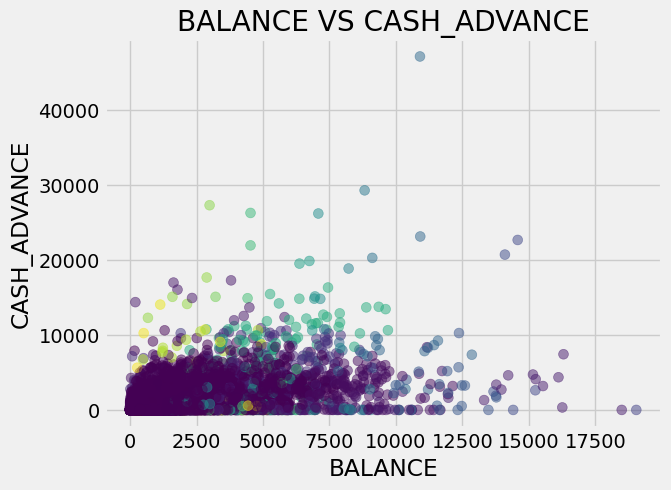

...

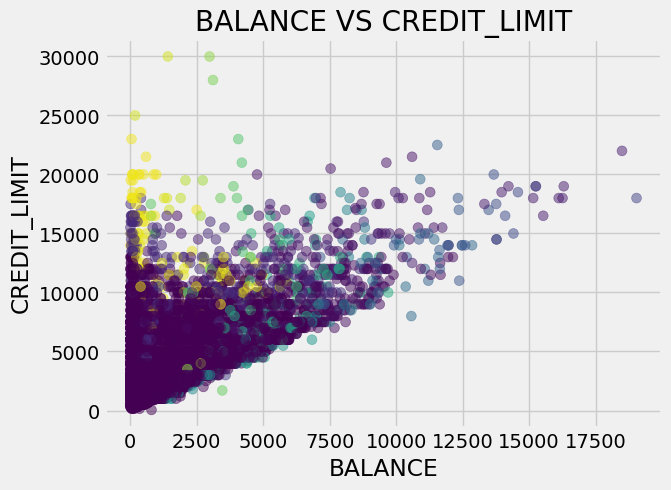

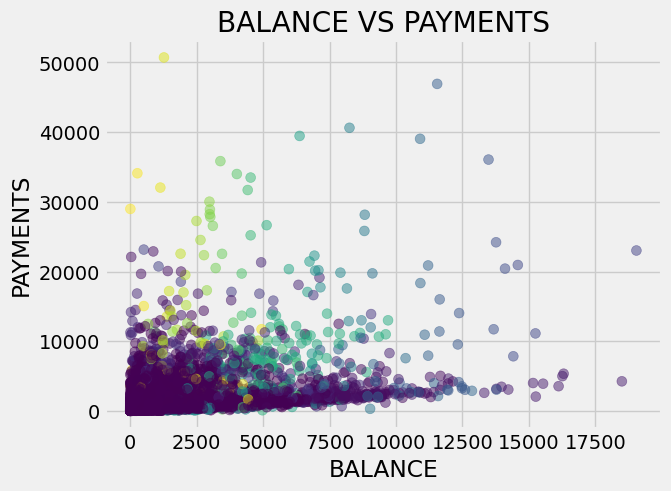

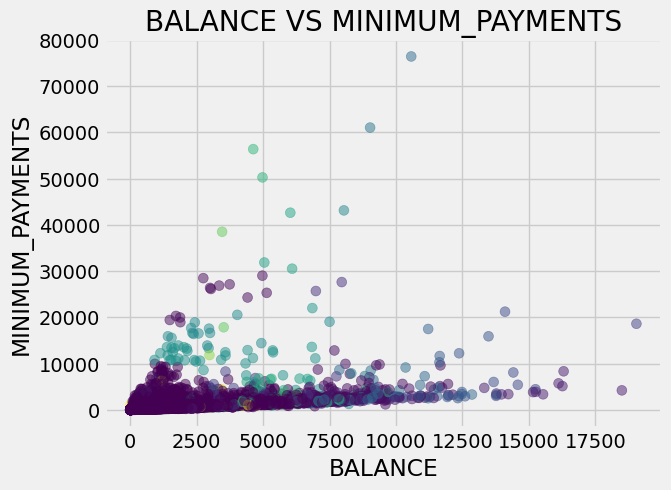

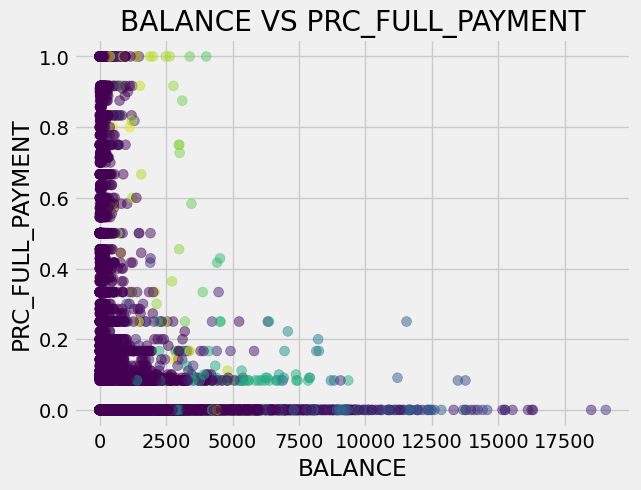

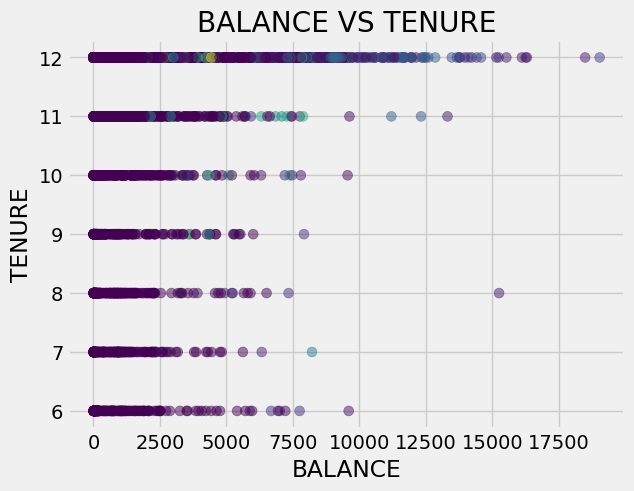

In [47]:
values=['BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',	'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY','CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',	'TENURE']
for val in values:
    plt.title("BALANCE VS " + val)
    plt.scatter(new_df['BALANCE'], new_df[val], c=model_MeanShift.labels_.astype(float), s=50, alpha=0.5)
    plt.xlabel('BALANCE')
    plt.ylabel(val)
    plt.show()

In [48]:
model_AgglomerativeClustering_1 = AgglomerativeClustering()
model_AgglomerativeClustering_1.fit(X_train)
model_AgglomerativeClustering = AgglomerativeClustering()
model_AgglomerativeClustering.fit(new_df)

AgglomerativeClustering()

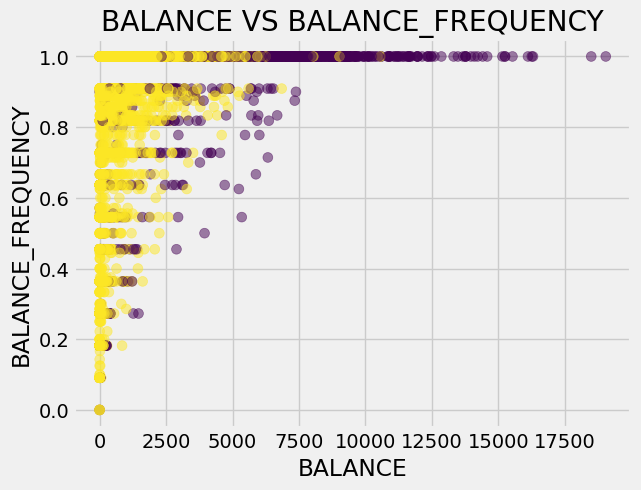

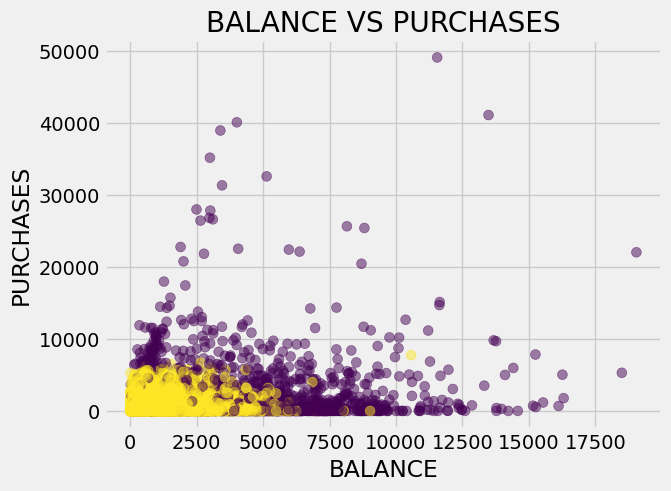

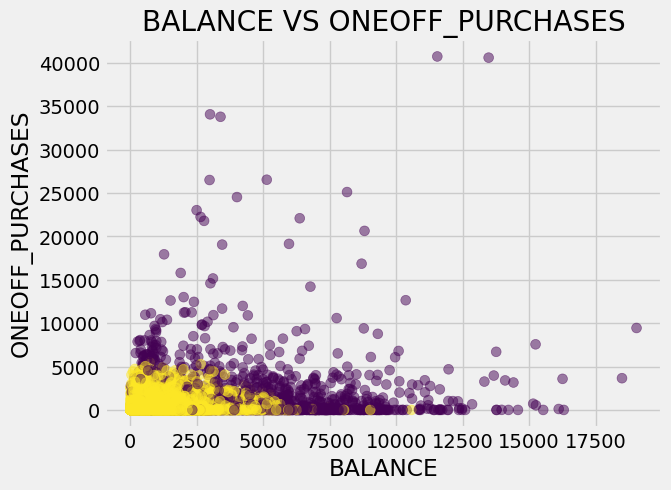

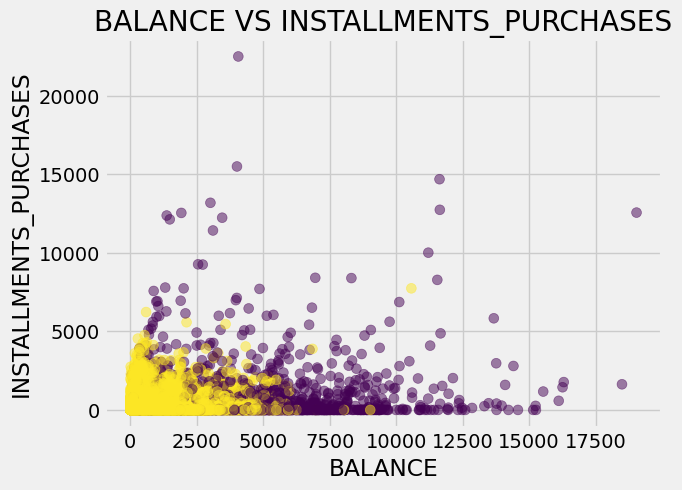

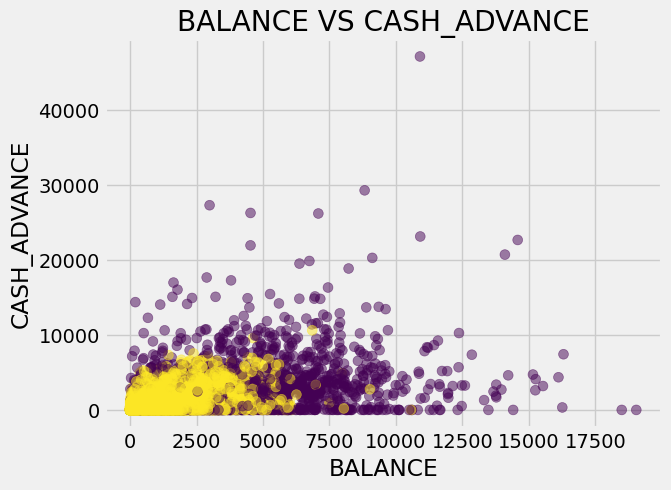

...

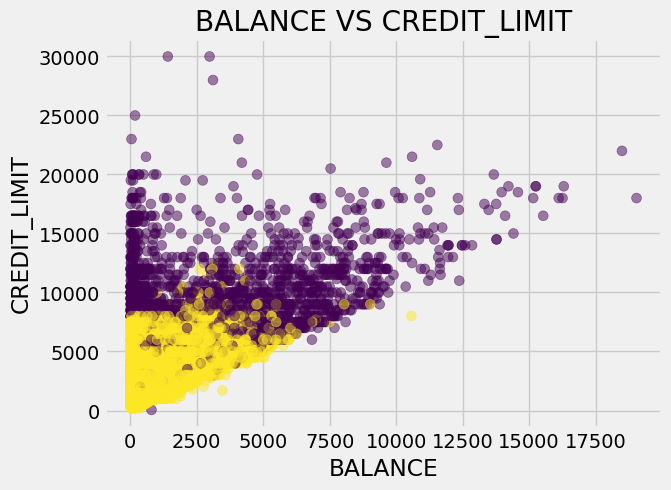

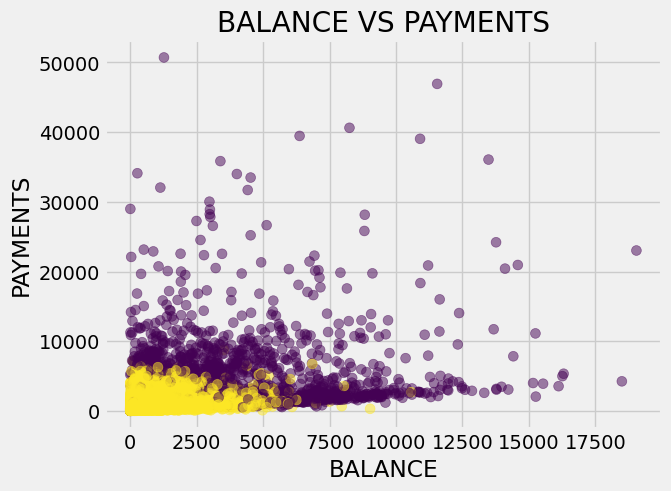

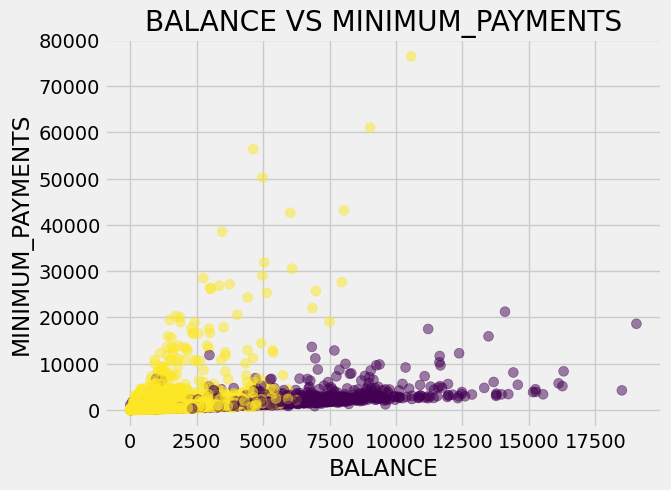

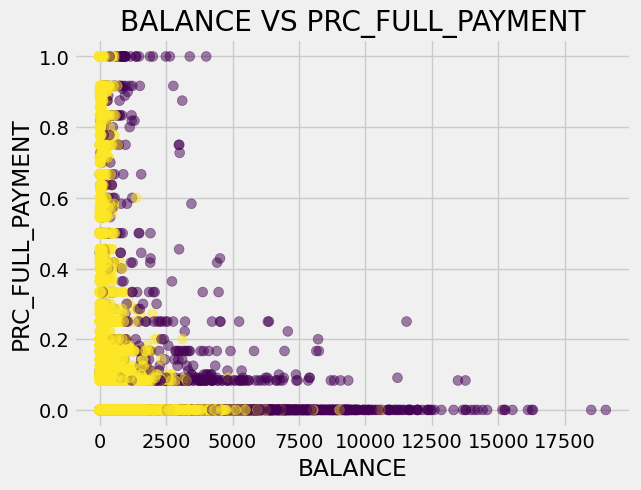

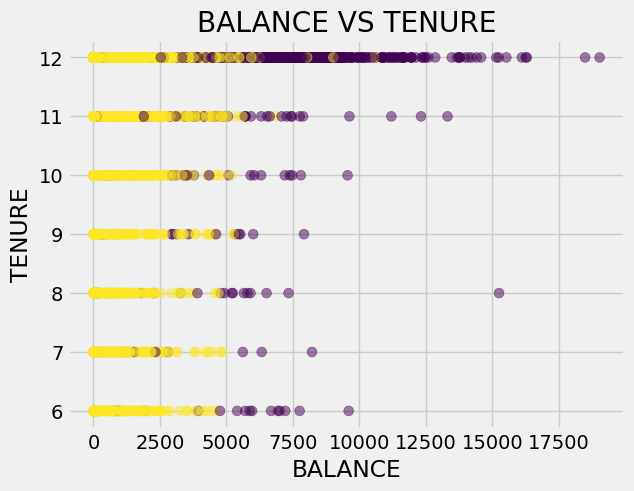

In [49]:
values=['BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',	'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY','CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',	'TENURE']
for val in values:
    plt.title("BALANCE VS " + val)
    plt.scatter(new_df['BALANCE'], new_df[val], c=model_AgglomerativeClustering.labels_.astype(float), s=50, alpha=0.5)
    plt.xlabel('BALANCE')
    plt.ylabel(val)
    plt.show()

In [50]:
model_DBSCAN_1 = DBSCAN()
model_DBSCAN_1.fit(X_train)
model_DBSCAN = DBSCAN()
model_DBSCAN.fit(new_df)

DBSCAN()

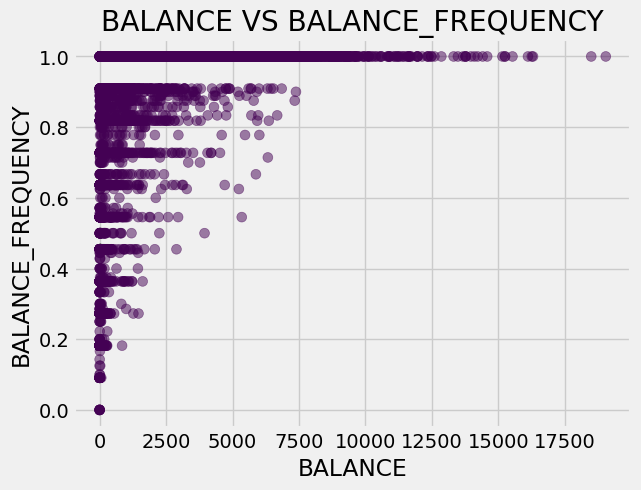

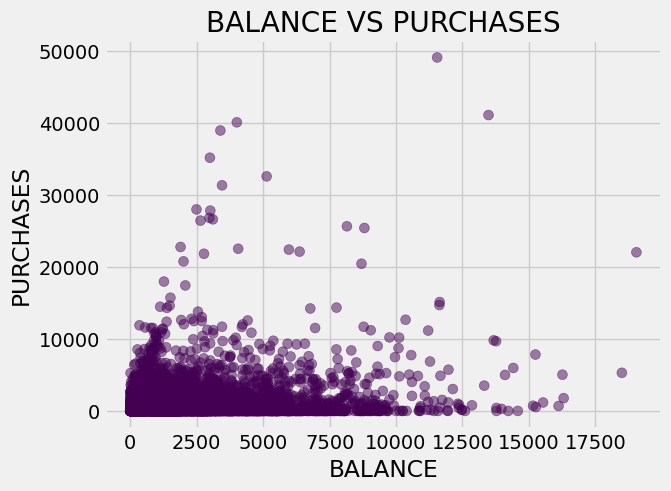

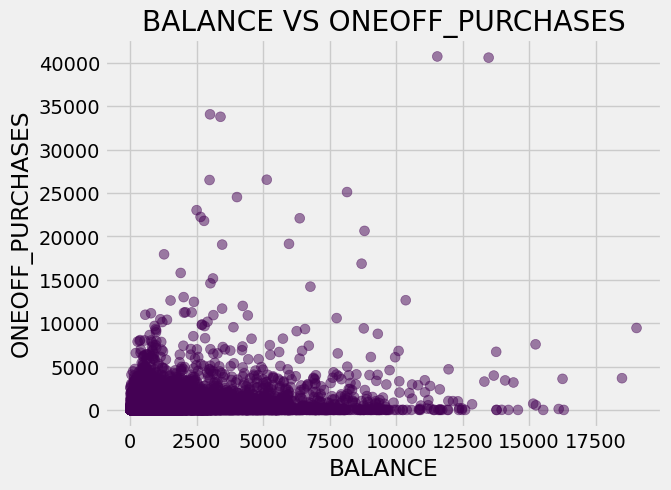

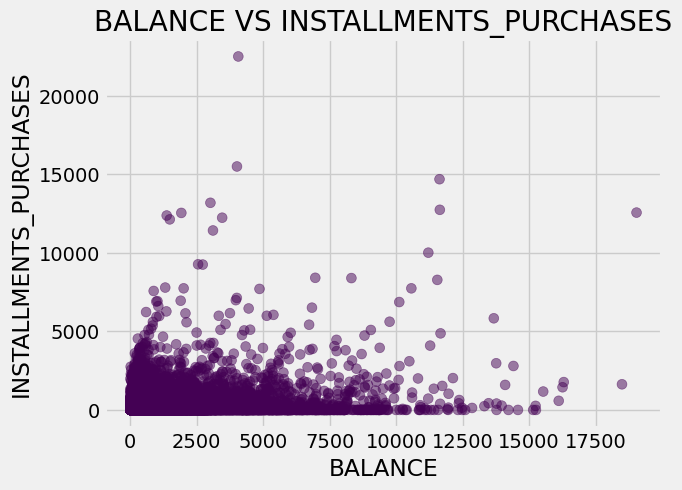

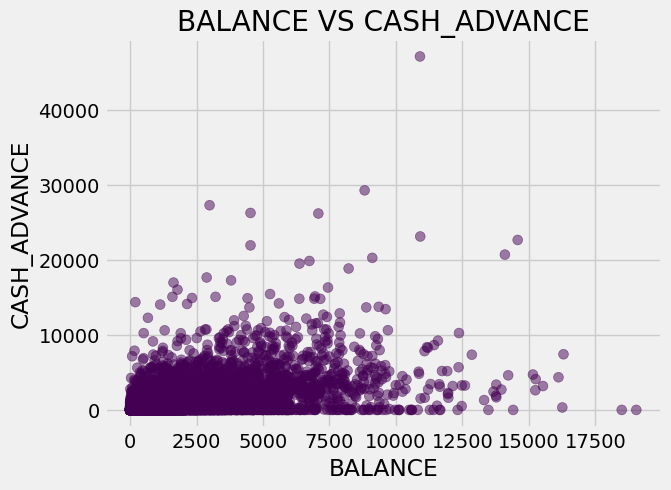

...

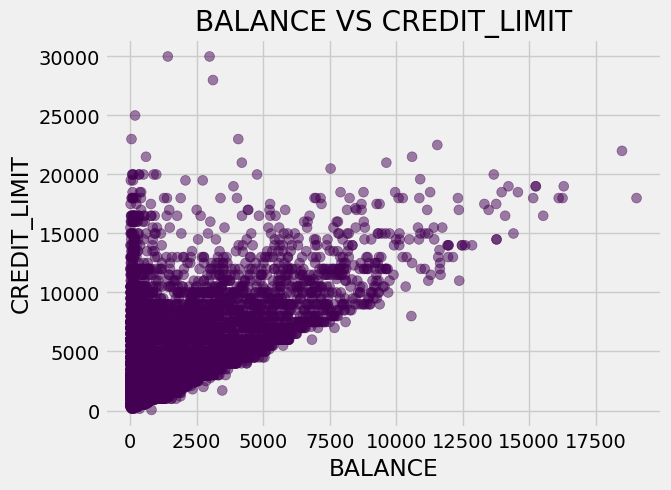

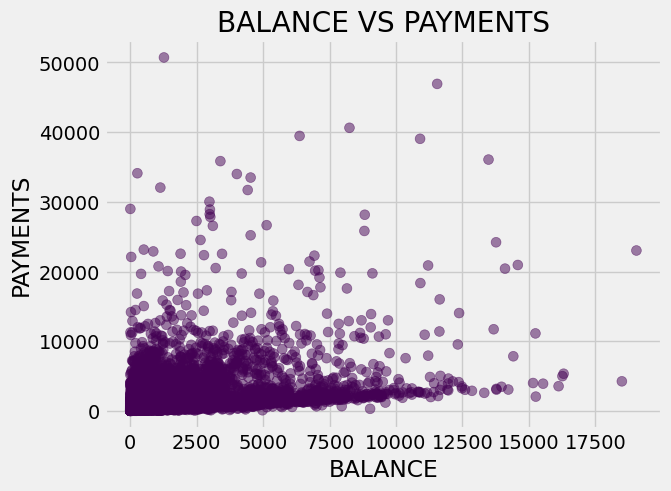

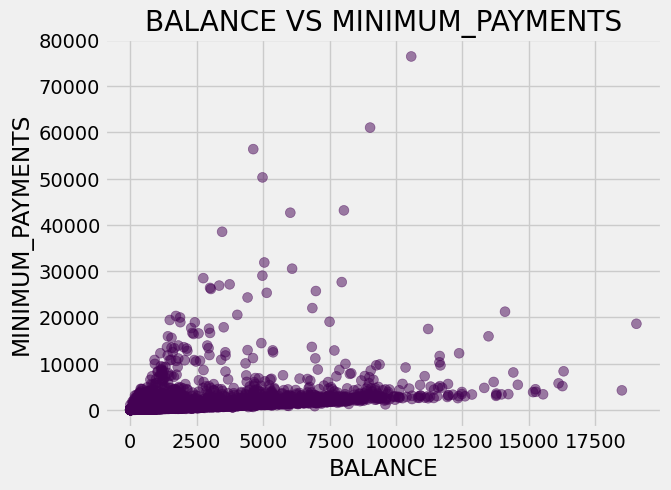

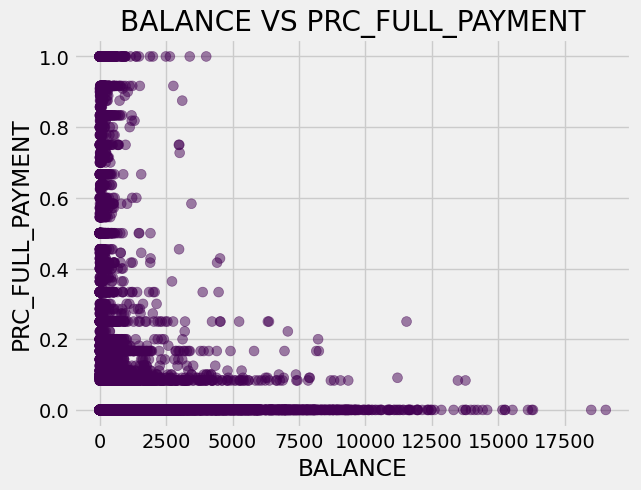

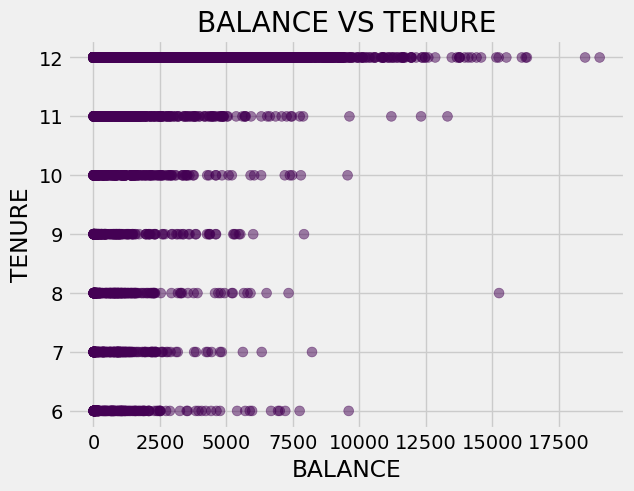

In [51]:
values=['BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',	'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY','CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',	'TENURE']
for val in values:
    plt.title("BALANCE VS " + val)
    plt.scatter(new_df['BALANCE'], new_df[val], c=model_DBSCAN.labels_.astype(float), s=50, alpha=0.5)
    plt.xlabel('BALANCE')
    plt.ylabel(val)
    plt.show()

In [52]:
model_Birch_1 = Birch()
model_Birch_1.fit(X_train)
pred_Birch =  model_Birch_1.predict(X_test)
model_Birch = Birch()
model_Birch.fit(new_df)

Birch()

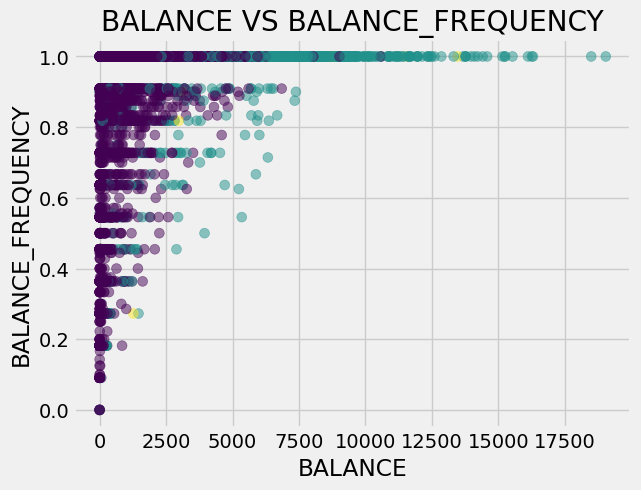

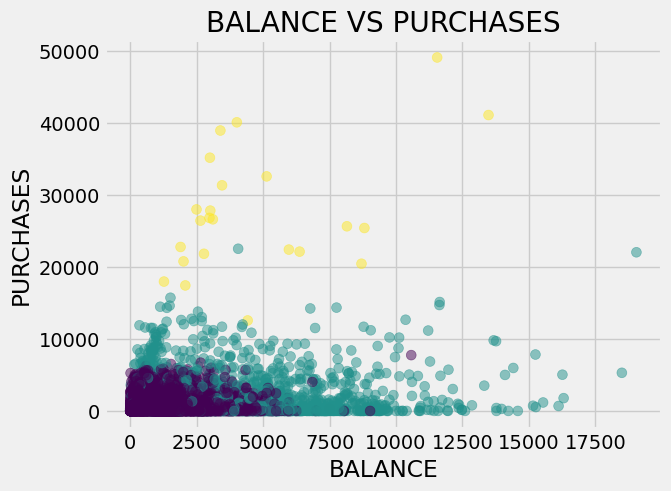

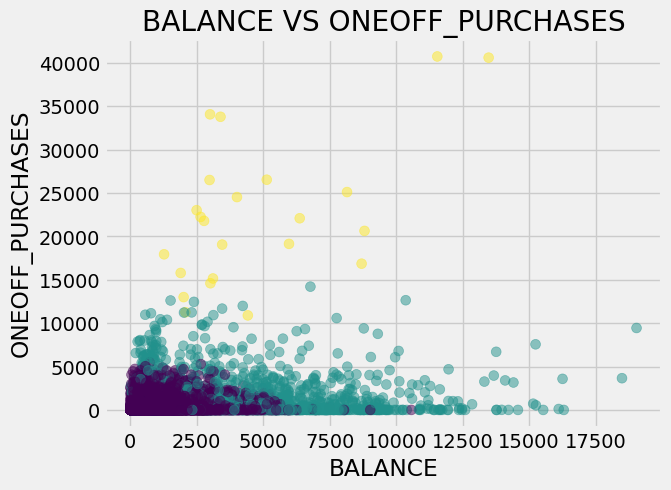

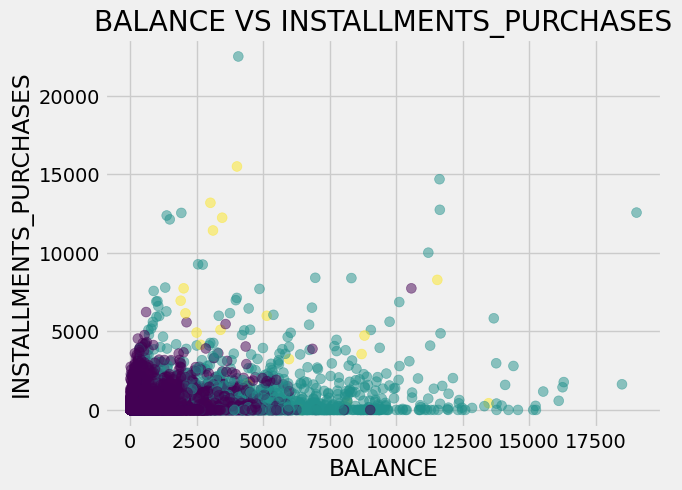

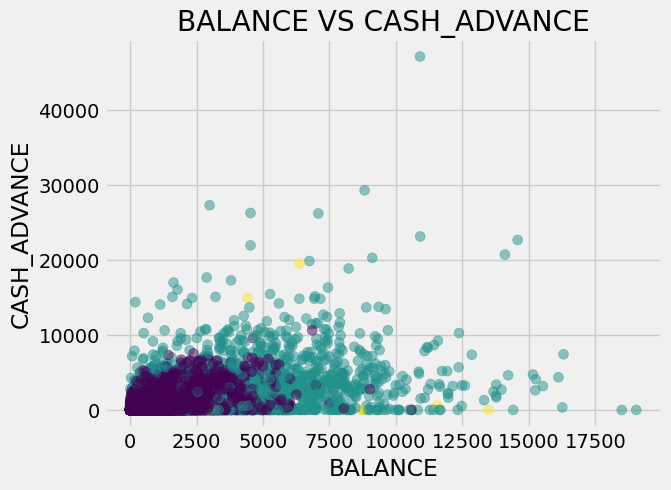

...

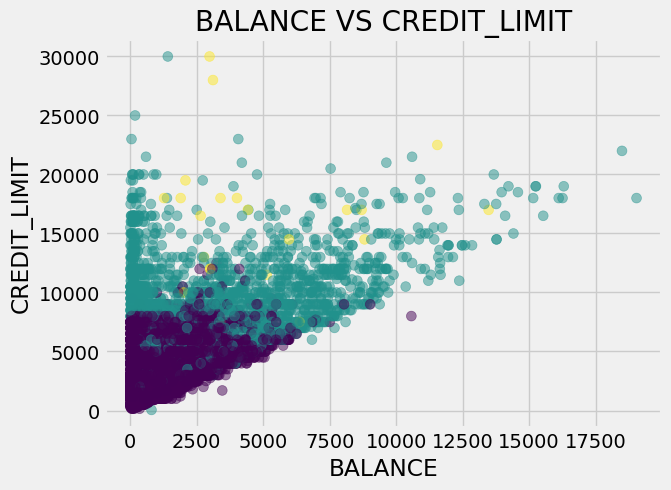

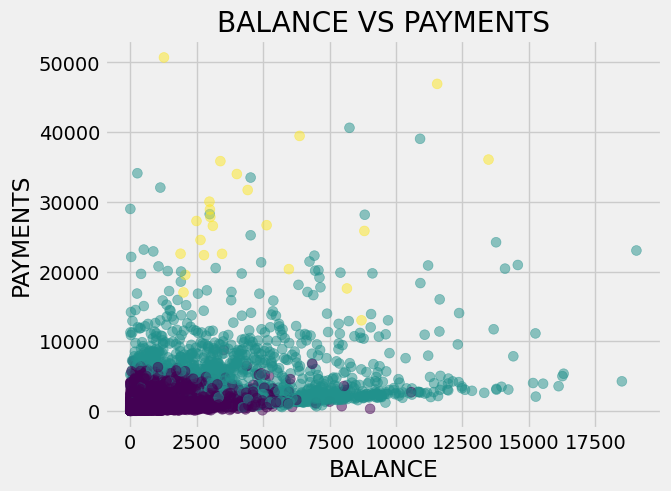

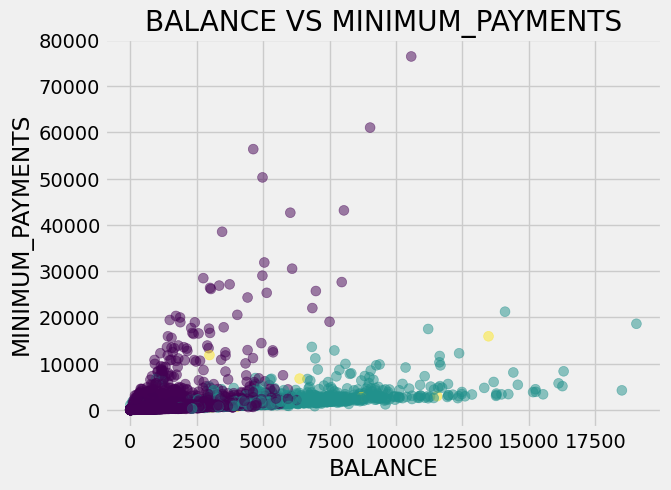

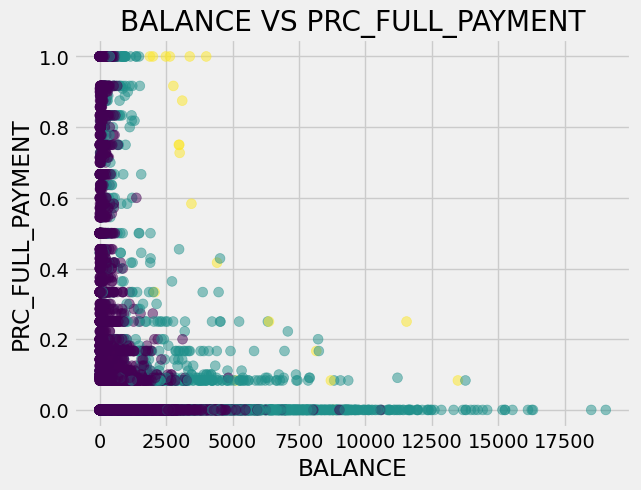

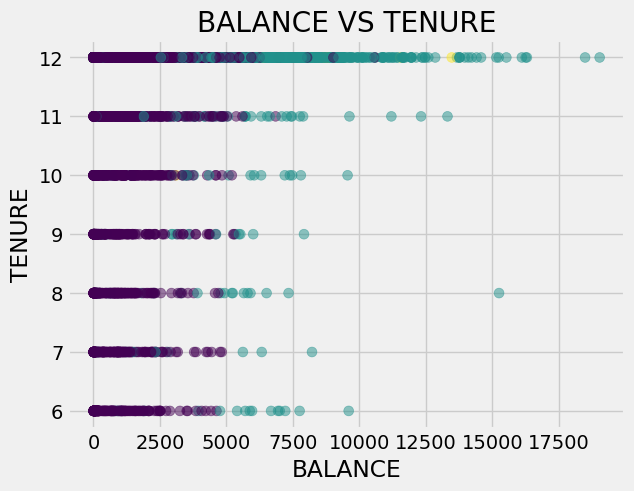

In [53]:
values=['BALANCE_FREQUENCY', 'PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES', 'CASH_ADVANCE', 'PURCHASES_FREQUENCY',	'ONEOFF_PURCHASES_FREQUENCY', 'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY','CASH_ADVANCE_TRX', 'PURCHASES_TRX', 'CREDIT_LIMIT', 'PAYMENTS', 'MINIMUM_PAYMENTS', 'PRC_FULL_PAYMENT',	'TENURE']
for val in values:
    plt.title("BALANCE VS " + val)
    plt.scatter(new_df['BALANCE'], new_df[val], c=model_Birch.labels_.astype(float), s=50, alpha=0.5)
    plt.xlabel('BALANCE')
    plt.ylabel(val)
    plt.show()

In [58]:
score_kmean = metrics.silhouette_score(new_df, model_kmean_3.labels_)
score_AffinityPropagation = metrics.silhouette_score(new_df, model_AffinityPropagation.labels_)
score_MeanShift = metrics.silhouette_score(new_df, model_MeanShift.labels_)
score_AgglomerativeClustering = metrics.silhouette_score(new_df, model_AgglomerativeClustering.labels_)
score_Birch = metrics.silhouette_score(new_df, model_Birch.labels_)
print('Silhouette Score in Kmeans clustering method: ', score_kmean)
print('Silhouette Score in Affinity Propagation clustering method: ', score_AffinityPropagation)
print('Silhouette Score in Mean Shift clustering method: ', score_MeanShift)
print('Silhouette Score in Agglomerative Clustering method: ', score_AgglomerativeClustering)
print('Silhouette Score in Birch clustering method: ', score_Birch)

Silhouette Score in Kmeans clustering method:  0.3615268990819131
Silhouette Score in Affinity Propagation clustering method:  0.19102745584102837
Silhouette Score in Mean Shift clustering method:  0.4164140454973015
Silhouette Score in Agglomerative Clustering method:  0.49972485265477606
Silhouette Score in Birch clustering method:  0.4942509934704669


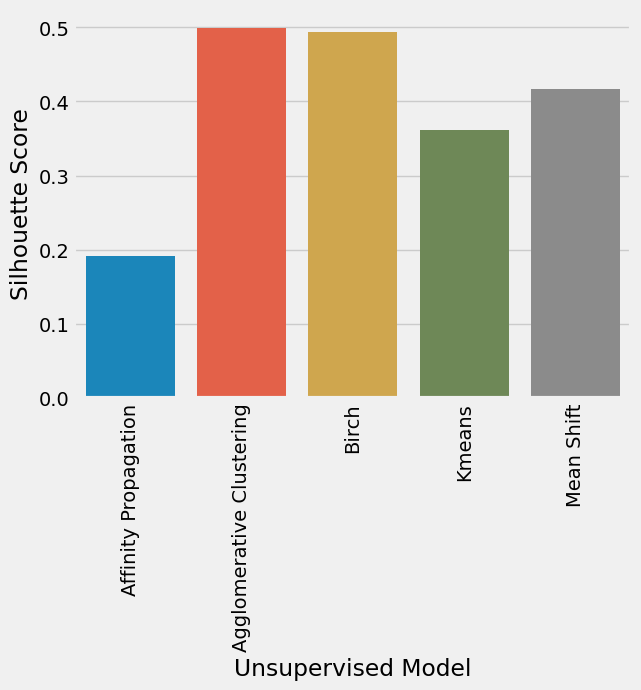

In [62]:
score={'Affinity Propagation':[0.19102745584102837], 'Agglomerative Clustering': [0.49972485265477606], 'Birch':[0.4942509934704669], 'Kmeans':[0.3615268990819131], 'Mean Shift':[0.4164140454973015]}
df = pd.DataFrame.from_dict(score)
sns.barplot(data=df)
plt.xticks(rotation=90)
plt.xlabel('Unsupervised Model')
plt.ylabel('Silhouette Score')
plt.show()

In [61]:
score_kmean = metrics.calinski_harabasz_score(new_df, model_kmean_3.labels_)
score_AffinityPropagation = metrics.calinski_harabasz_score(new_df, model_AffinityPropagation.labels_)
score_MeanShift = metrics.calinski_harabasz_score(new_df, model_MeanShift.labels_)
score_AgglomerativeClustering = metrics.calinski_harabasz_score(new_df, model_AgglomerativeClustering.labels_)
score_Birch = metrics.calinski_harabasz_score(new_df, model_Birch.labels_)
print('Calinski Harabasz Score in Kmeans clustering method: ', score_kmean)
print('Calinski Harabasz Score in Affinity Propagation clustering method: ', score_AffinityPropagation)
print('Calinski Harabasz Score in Mean Shift clustering method: ', score_MeanShift)
print('Calinski Harabasz Score in Agglomerative Clustering method: ', score_AgglomerativeClustering)
print('Calinski Harabasz Score in Birch clustering method: ', score_Birch)

Calinski Harabasz Score in Kmeans clustering method:  2266.8219588006027
Calinski Harabasz Score in Affinity Propagation clustering method:  688.2874158829625
Calinski Harabasz Score in Mean Shift clustering method:  150.2239410678899
Calinski Harabasz Score in Agglomerative Clustering method:  3123.186306248416
Calinski Harabasz Score in Birch clustering method:  2500.5660360747643


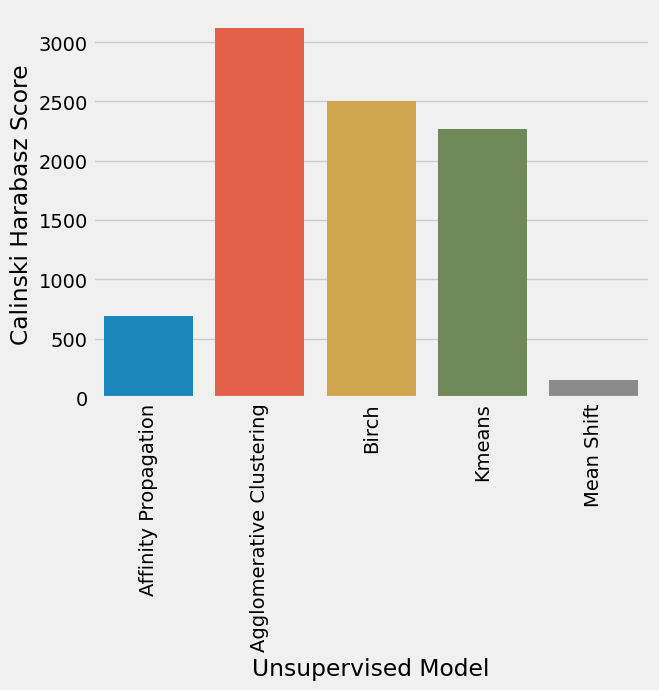

In [63]:
score={'Affinity Propagation':[688.2874158829625], 'Agglomerative Clustering': [3123.186306248416], 'Birch':[2500.5660360747643], 'Kmeans':[2266.8219588006027], 'Mean Shift':[150.2239410678899]}
df = pd.DataFrame.from_dict(score)
sns.barplot(data=df)
plt.xticks(rotation=90)
plt.xlabel('Unsupervised Model')
plt.ylabel('Calinski Harabasz Score')
plt.show()

In [64]:
score_kmean = metrics.davies_bouldin_score(new_df, model_kmean_3.labels_)
score_AffinityPropagation = metrics.davies_bouldin_score(new_df, model_AffinityPropagation.labels_)
score_MeanShift = metrics.davies_bouldin_score(new_df, model_MeanShift.labels_)
score_AgglomerativeClustering = metrics.davies_bouldin_score(new_df, model_AgglomerativeClustering.labels_)
score_Birch = metrics.davies_bouldin_score(new_df, model_Birch.labels_)
print('Davies Bouldin Score in Kmeans clustering method: ', score_kmean)
print('Davies Bouldin Score in Affinity Propagation clustering method: ', score_AffinityPropagation)
print('Davies Bouldin Score in Mean Shift clustering method: ', score_MeanShift)
print('Davies Bouldin Score in Agglomerative Clustering method: ', score_AgglomerativeClustering)
print('Davies Bouldin Score in Birch clustering method: ', score_Birch)

Davies Bouldin Score in Kmeans clustering method:  1.1071913581917179
Davies Bouldin Score in Affinity Propagation clustering method:  0.9848116947521732
Davies Bouldin Score in Mean Shift clustering method:  0.61016673795016
Davies Bouldin Score in Agglomerative Clustering method:  1.2903324932273808
Davies Bouldin Score in Birch clustering method:  1.0367763490439552


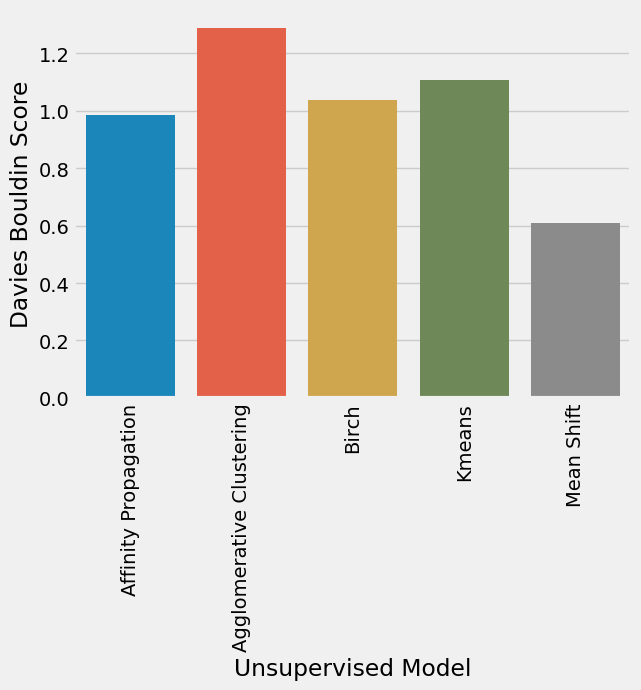

In [69]:
score={'Affinity Propagation':[0.9848116947521732], 'Agglomerative Clustering': [1.2903324932273808], 'Birch':[1.0367763490439552], 'Kmeans':[1.1071913581917179], 'Mean Shift':[0.61016673795016]}
df = pd.DataFrame.from_dict(score)
sns.barplot(data=df)
plt.xticks(rotation=90)
plt.xlabel('Unsupervised Model')
plt.ylabel('Davies Bouldin Score')
plt.show()